# Retail Super Market Sales (Regression)
__Author: Mohammed Salman__

# Summary of the Assignment:

__a) Insights from EDA__
1. There are ~1600 unique products being sold.
2. The items that are highly visible dont drive much sales, maybe these are items that are near cash counter or near the entrance.
3. Item MRP and Sales are linearly related, which makes sense, buying an expensive rare fish will drive sales more compared to buying a chocolate bar.
4. If its from Out027 then the sales is usually higher than others, it is probably located at prime location and could just be a huge store.
5. Out010 and Out019 are with the lowest sales, could be small stores with less products or at a less populated location.
6. Tier 3 locations seems to be slightly higher in driving sales.
7. Outlet size of medium seems to be highly higher in driving sales.
8. Older established stores have, the oldest est.1985 has made the highest sales, probably due to the knowledge and customer base since all those years.


__b) Questions to ask Business__

1. Item Weight: What scale is this in? Kg or pounds? Both kg and pounds seem unlikely because 4.55 being minimum, if Kg that's not possible, bread is usually sold under 1kg. If its pounds, 4.55/2.2 = 2.04 Kg this again does not make sense. Maximum can be almost upto 100kg, like rice bag etc., this checks out.
2. Item Visibility: Does 0 mean that the product is behind other products in the shelf?
3. Item MRP: What currency is this in? Maximum is only 266 MRP.
4. Outlet Est. Year: Old Grocery stores to most recent store being 35 years old to 12 years old respectively.
5. Outlet Sales: Is this yearly/monthly/bi-annual/FY/bi-FY sales?
6. How will be end users of this solution?


In [103]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.pipeline import Pipeline
import random
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib as m
from sklearn.preprocessing import StandardScaler, Normalizer, OneHotEncoder, LabelEncoder, OrdinalEncoder
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, confusion_matrix, precision_score, \
recall_score, roc_curve, roc_auc_score, precision_recall_curve, mean_absolute_error, r2_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
np.set_printoptions(suppress=True)
import statistics
import pickle
import re
from xgboost import XGBClassifier, XGBRegressor, plot_tree
import joblib
import lime
import lime.lime_tabular

# Reading Train data

In [128]:
train_df = pd.read_csv('train.csv')

In [129]:
train_df

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052
...,...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,2778.3834
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,1193.1136
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,1845.5976


# Checks for missing values:

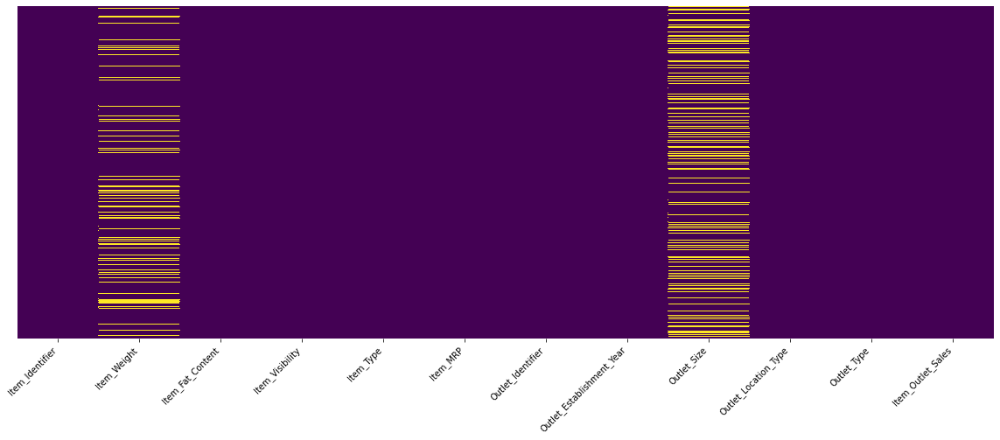

In [4]:
plt.figure(figsize=(20,7))

g = sns.heatmap(train_df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
f = g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

In [5]:
(train_df.isna().sum()*100)/len(train_df)

Item_Identifier               0.000000
Item_Weight                  17.165317
Item_Fat_Content              0.000000
Item_Visibility               0.000000
Item_Type                     0.000000
Item_MRP                      0.000000
Outlet_Identifier             0.000000
Outlet_Establishment_Year     0.000000
Outlet_Size                  28.276428
Outlet_Location_Type          0.000000
Outlet_Type                   0.000000
Item_Outlet_Sales             0.000000
dtype: float64

#### Need for imputing data on Outlet Size and Item Weight

#### To check if  ID is unique: (for duplicate records ) [Note: Products can repeat in different stores]

In [6]:
if len(set(train_df['Item_Identifier'])) == len(train_df['Item_Identifier']) and 'Item_Identifier' in train_df.columns:
    del train_df['Item_Identifier']

In [7]:
len(set(train_df['Item_Identifier'])), len(train_df)

(1559, 8523)

In [8]:
train_df['Item_Identifier'].unique()

array(['FDA15', 'DRC01', 'FDN15', ..., 'NCF55', 'NCW30', 'NCW05'],
      dtype=object)

In [9]:
train_df[(train_df['Item_Identifier']) == 'FDA15']

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.3,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
831,FDA15,9.3,Low Fat,0.016055,Dairy,250.2092,OUT045,2002,NaN,Tier 2,Supermarket Type1,5976.2208
2599,FDA15,9.3,Low Fat,0.016019,Dairy,248.5092,OUT035,2004,Small,Tier 2,Supermarket Type1,6474.2392
2643,FDA15,9.3,Low Fat,0.016088,Dairy,249.6092,OUT018,2009,Medium,Tier 3,Supermarket Type2,5976.2208
4874,FDA15,9.3,Low Fat,0.026818,Dairy,248.9092,OUT010,1998,NaN,Tier 3,Grocery Store,498.0184
5413,FDA15,9.3,Low Fat,0.016009,Dairy,250.6092,OUT013,1987,High,Tier 3,Supermarket Type1,6474.2392
6696,FDA15,NaN,Low Fat,0.015945,Dairy,249.5092,OUT027,1985,Medium,Tier 3,Supermarket Type3,6474.2392
7543,FDA15,9.3,LF,0.016113,Dairy,248.8092,OUT017,2007,NaN,Tier 2,Supermarket Type1,5976.2208


#### Summary of the products:

1. There are ~1600 unique products being sold 
2. Each product has multiple rows because it being sold at different outlets that were established at different years, item visibility being different and different stores making different sales out of the product etc.
3. Item Weight is something that will not change, the missing values in this column can be easily imputed, as the weight of the item will __likely__ not change across outlets.

### Identify categorical and numerical features: 

In [10]:
# Consider it a category if there are 20 or less unique values for first glance
thresh = 53

if [col for col in train_df.columns if len(train_df[col].unique()) <=thresh ]:
     cat_var = [col for col in train_df.columns if len(train_df[col].unique()) <=thresh and col != 'Item_Outlet_Sales']  
if [col for col in train_df.columns if len(train_df[col].unique()) > thresh]:
     num_var = [col for col in train_df.columns if len(train_df[col].unique()) > thresh and col != 'Item_Outlet_Sales']
        
print('Categorical columns are: ', cat_var, len(cat_var))
print('\n\nNumerical columns are: ', num_var, len(num_var))

Categorical columns are:  ['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type'] 7


Numerical columns are:  ['Item_Identifier', 'Item_Weight', 'Item_Visibility', 'Item_MRP'] 4


# Exploratory Data Analysis:

In [56]:
##### plot styling #####
sns.set_style("whitegrid")
sns.set_palette("bright")

#### Target variable distribution:

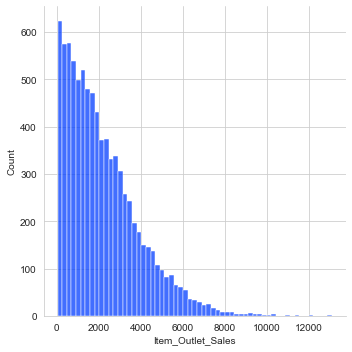

In [57]:
sns.displot(train_df['Item_Outlet_Sales'])

In [58]:
train_df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


#### Summary of Target Variable and numerical independant stats:


* Item Weight:
    - What scale is this in? Kg or pounds? Both kg and pounds seem unlikely because 4.55 being minimum, if Kg that's not possible, bread is usually sold under 1kg. If its pounds, 4.55/2.2 = 2.04 Kg this again does not make sense.
    - Maximum can be almost upto 100kg, like rice bag etc., this checks out.
    
    
* Item Visibility: 
    - Does 0 mean that the product is behind other products in the shelf?


* Item MRP:
    - What currency is this in? Maximum is only 266 MRP.


* Outlet Est. Year:
    - Old Grocery stores to most recent store being 35 years old to 12 years old respectively.


* Outlet Sales:
    - Is this yearly/monthly/bi-annual/FY/bi-FY sales?

In [17]:
def numeric_to_numerical(col, target_var='Item_Outlet_Sales'):
    print(min(train_df[col]), max(train_df[col]))
    plt.figure(figsize=(12,7))
    sns.scatterplot(x=col, y=target_var, data=train_df, palette='winter')
    plt.title(col)
    plt.show()


In [18]:
def categoric_to_numerical(col, target_var='Item_Outlet_Sales'):
    if col != target_var:
        plt.figure(figsize=(12,7))
        sns.boxplot(x=col, y=target_var, data=train_df, palette='winter', whis=1.5)
        plt.xticks(rotation=30)
        plt.title(col)
        plt.show()
    
    sns.FacetGrid(train_df, hue = col, size = 8).map(sns.distplot, target_var).add_legend()
    plt.show()

DRA12 NCZ54


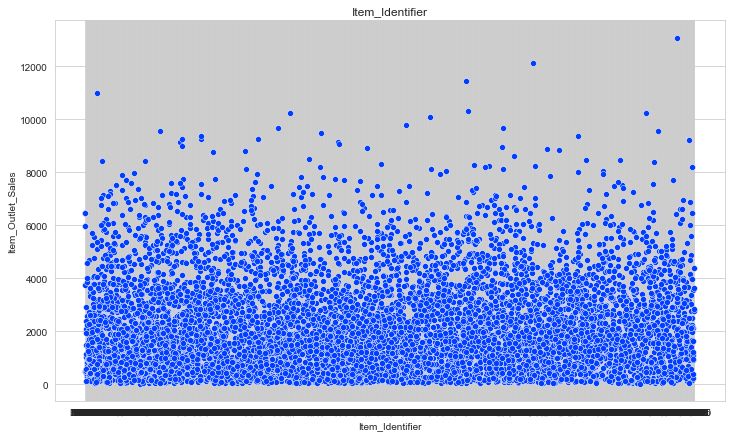

4.555 21.35


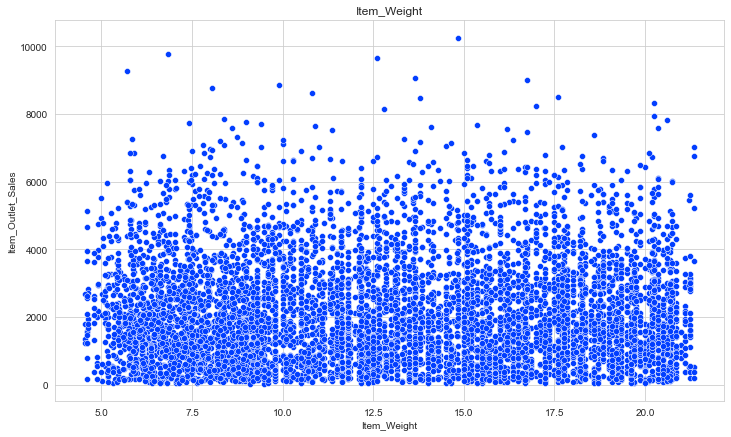

0.0 0.328390948


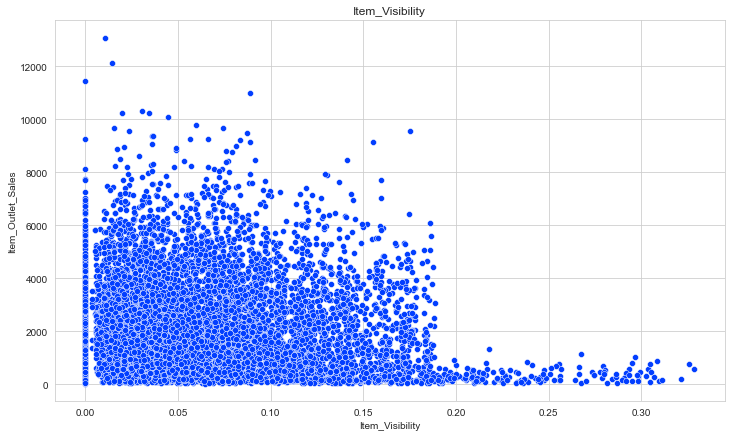

31.29 266.8884


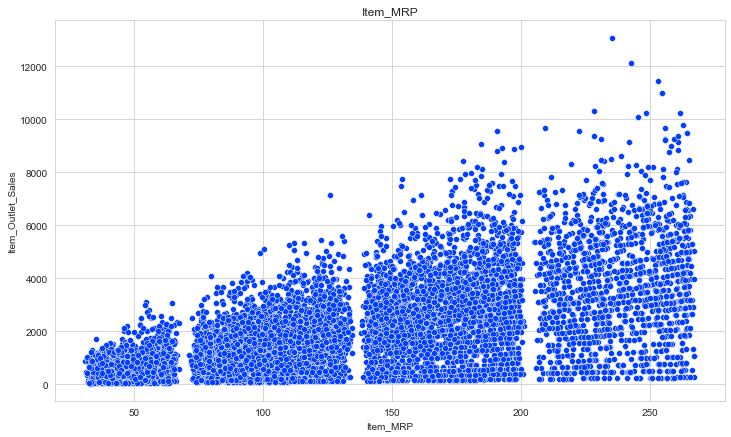

In [19]:
for numerical in num_var:
    numeric_to_numerical(numerical)

#### Summary of above numerical variables:

* Item Visibility:
    - The items that are highly visible dont drive much sales, maybe these are items that are near cash counter or near the entrance.
    - Visibility less than 0.2 are the items that drive the sales the most, this could be because essentials are not so visible but everyone buys them.
    
    
    
* MRP:
    - Item MRP and Sales are linearly related, which makes sense, buying an expensive rare fish will drive sales more compared to buying a chocolate bar.


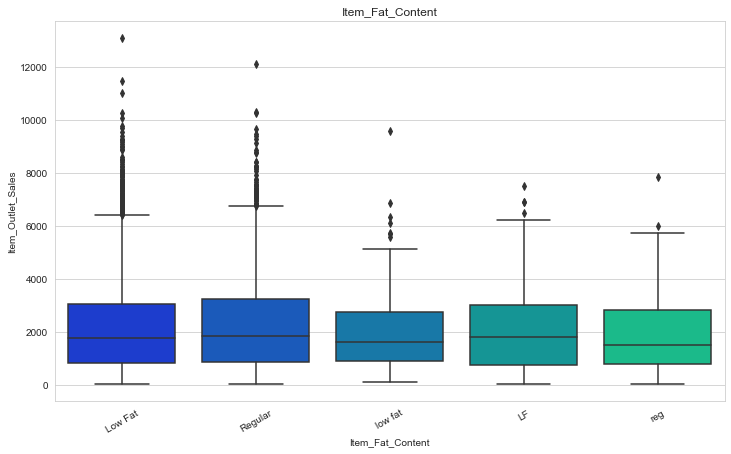

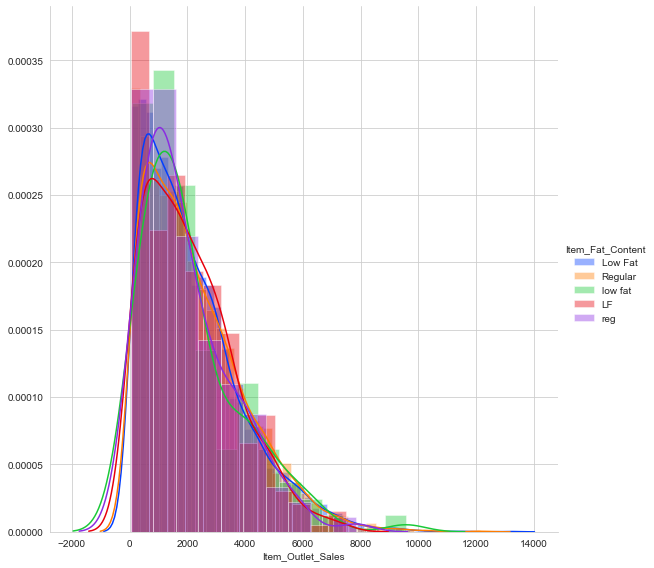

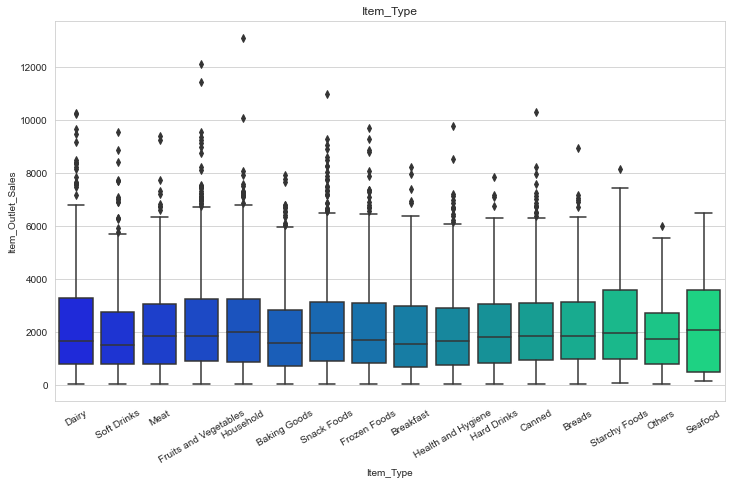

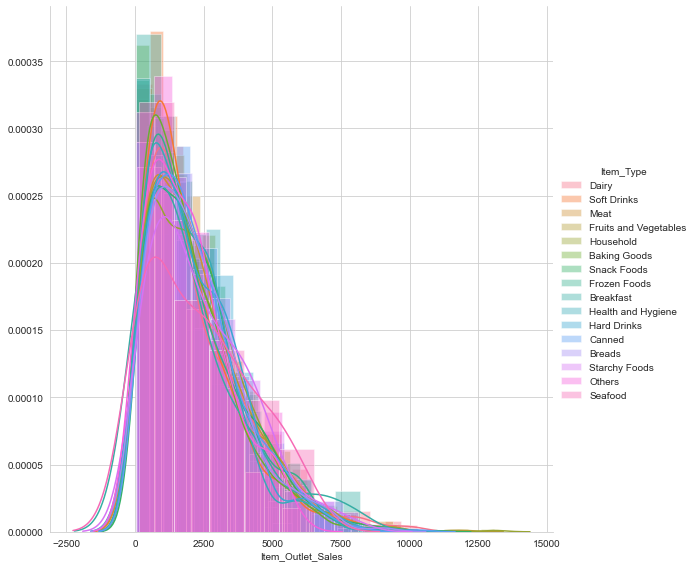

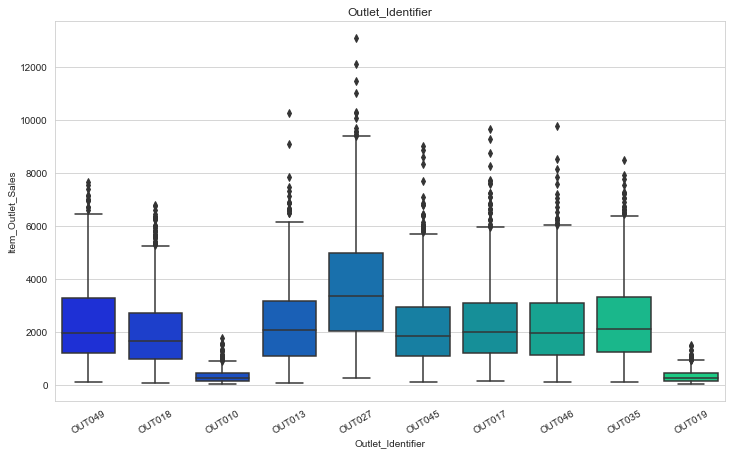

...

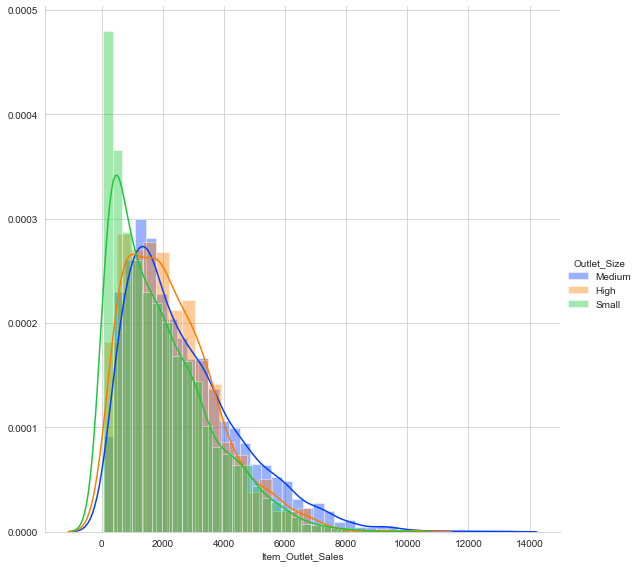

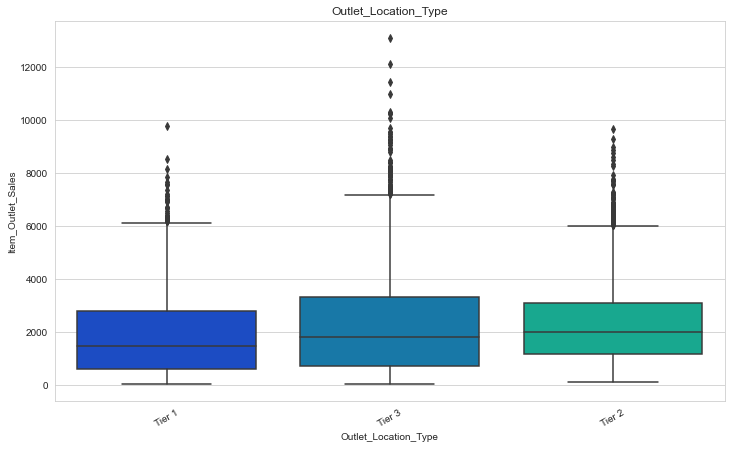

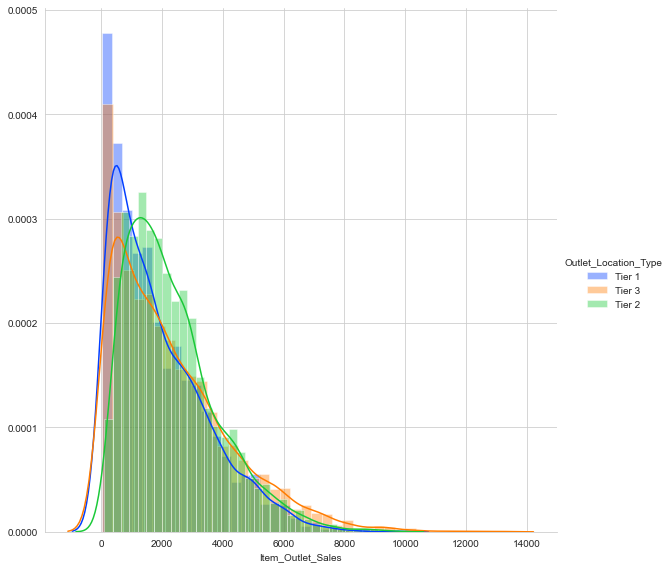

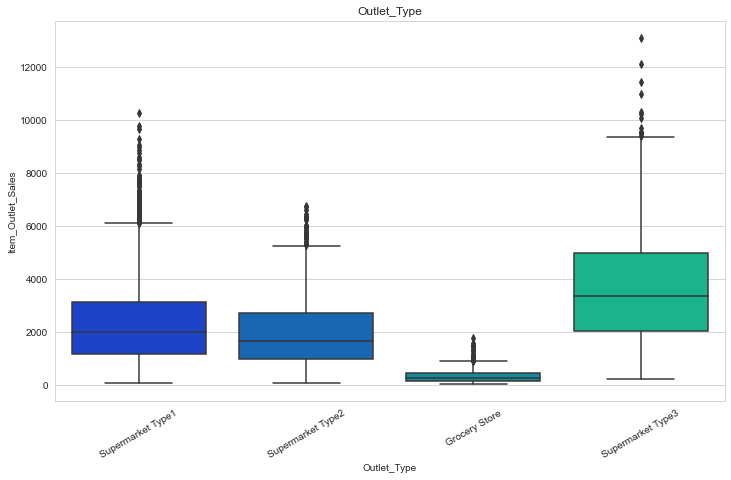

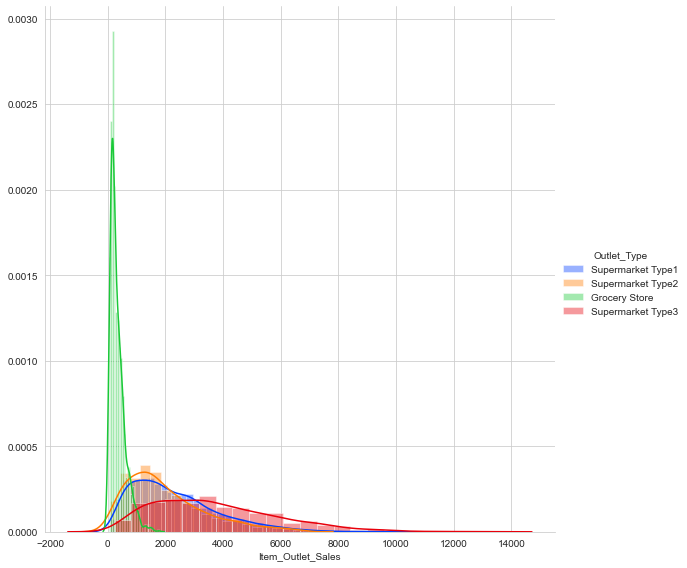

In [16]:
for categorical in cat_var:
    categoric_to_numerical(categorical)

#### Summary of above categorical variables:
* Item Fat Content:
    - LF, low fat must be forms of Low Fat, reg must be a form of Regular
    - Need for revisit


* Item Type:
    - There Outlet Sales is distributed pretty flat on every Item type.


* Outlet Identifier:
    - If its from Out027 then the sales is usually higher than others, it is probably located at prime location and could just be a huge store.
    - Out010 and Out019 are with the lowest sales, could be small stores with less products or at a less populated location.
    - The other outlets are pretty much equal in their contribution of sales.
    
    
* Outlet Type:
    - Grocery stores seems to be smaller as they produce less sales compared to massive sales from Supermarket Type3 which seems to be a larger store.
    - Type 1 and Type 2 are similar in their Sales.
    
    
* Outlet Location Type:
     - Tier 3 locations seems to be slightly higher in driving sales.


* Outlet size:
    - Outlet size of medium seems to be highly higher in driving sales.
    
    
* Established year:
    - Older established stores have, the oldest est.1985 has made the highest sales, probably due to the knowledge and customer base since all those years.
    - Store establish in 1998 was probably a grocery outlet type and therefore driving the sales the least.


In [20]:
train_df[train_df['Outlet_Identifier'] == 'OUT027']

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
7,FDP10,NaN,Low Fat,0.127470,Snack Foods,107.7622,OUT027,1985,Medium,Tier 3,Supermarket Type3,4022.7636
18,DRI11,NaN,Low Fat,0.034238,Hard Drinks,113.2834,OUT027,1985,Medium,Tier 3,Supermarket Type3,2303.6680
21,FDW12,NaN,Regular,0.035400,Baking Goods,144.5444,OUT027,1985,Medium,Tier 3,Supermarket Type3,4064.0432
36,FDV20,NaN,Regular,0.059512,Fruits and Vegetables,128.0678,OUT027,1985,Medium,Tier 3,Supermarket Type3,2797.6916
38,FDX10,NaN,Regular,0.123111,Snack Foods,36.9874,OUT027,1985,Medium,Tier 3,Supermarket Type3,388.1614
...,...,...,...,...,...,...,...,...,...,...,...,...
8472,NCS41,NaN,Low Fat,0.053185,Health and Hygiene,182.9608,OUT027,1985,Medium,Tier 3,Supermarket Type3,1653.8472
8485,DRK37,NaN,Low Fat,0.043792,Soft Drinks,189.0530,OUT027,1985,Medium,Tier 3,Supermarket Type3,6261.8490
8487,DRG13,NaN,Low Fat,0.037006,Soft Drinks,164.7526,OUT027,1985,Medium,Tier 3,Supermarket Type3,4111.3150
8488,NCN14,NaN,Low Fat,0.091473,Others,184.6608,OUT027,1985,Medium,Tier 3,Supermarket Type3,2756.4120


#### The above Outlet Identifier and our results on Location Type and Outlet Size are comprable.

# Bivariate Analysis

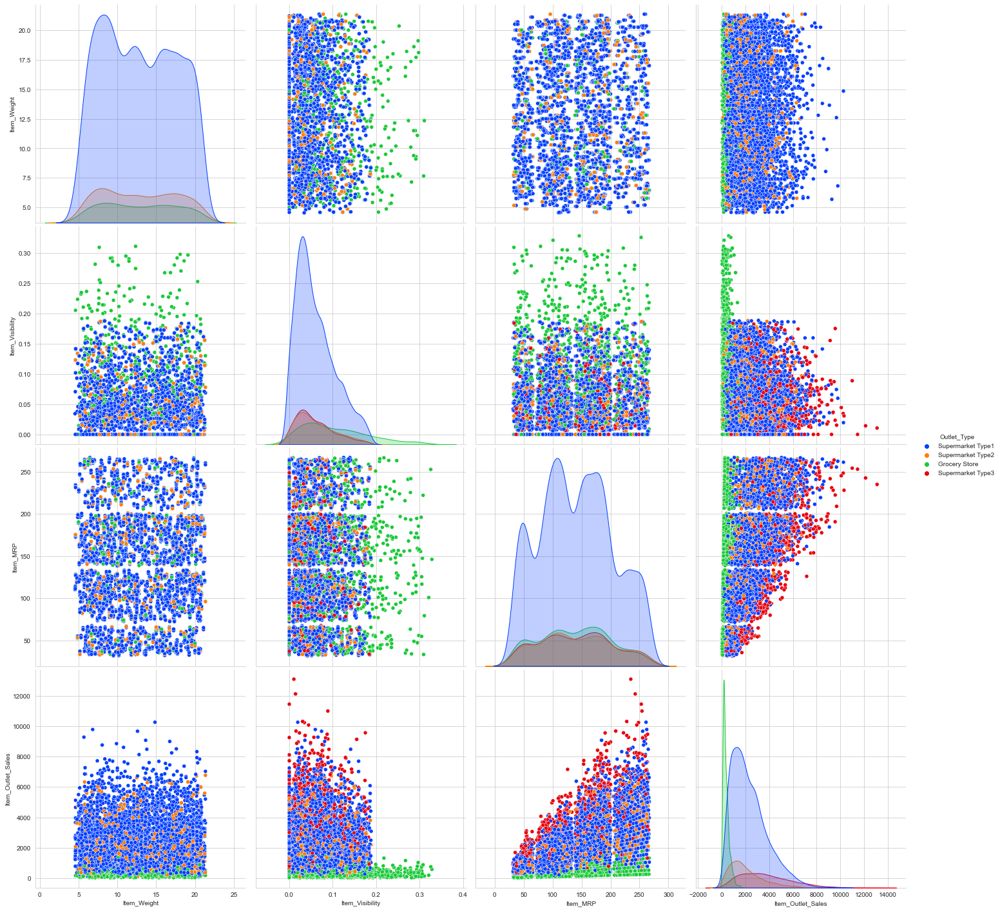

In [21]:
sns.pairplot(train_df[num_var+['Item_Outlet_Sales', 'Outlet_Type']], hue = 'Outlet_Type', size = 5)
plt.show()

#### Summary of pair plot:

- All types of Outlets contains products of all MRP, but its the Supermarket type 3 that is driving the sales.
- The Grocery stores have the highest visibility, probably due to less products and smaller store.
- More visibility doesnt mean more sales, the Grocery store is a smaller driving force to increase Outlet sales.

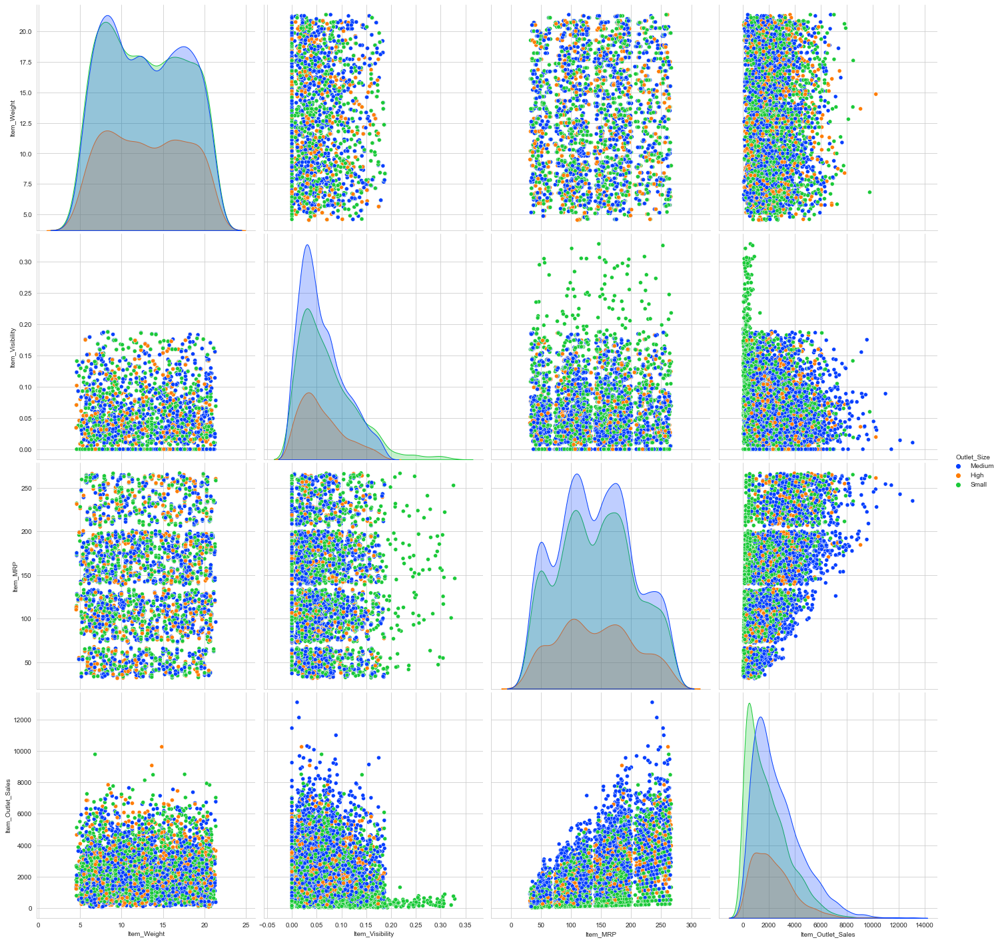

In [22]:
sns.pairplot(train_df[num_var+['Item_Outlet_Sales', 'Outlet_Size']], hue = 'Outlet_Size', size = 5)
plt.show()

#### Summary of the above plot:
- Higher MRP with higher outlet Sales, they are mostly Medium Sized
- Items with less than 0.2 visibility drive the most Outlet sales, highly visible and high Sales impacting are Outlet Size Medium

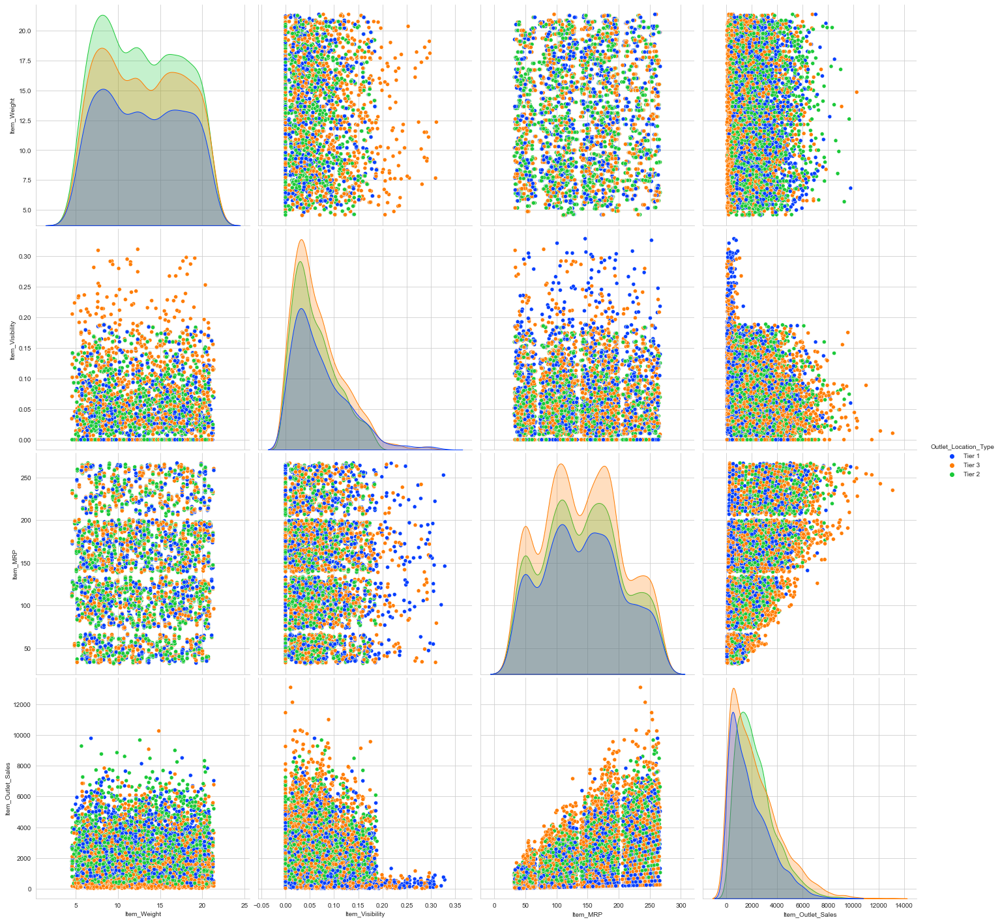

In [23]:
sns.pairplot(train_df[num_var+['Item_Outlet_Sales', 'Outlet_Location_Type']], hue = 'Outlet_Location_Type', size = 5)
plt.show()

#### Summary of the above plot:

- Higher MRP with higher outlet Sales, they are mostly Tier 3
- Items with less than 0.2 visibility drive the most Outlet sales, highly visible and high Sales impacting are Tier 3 Locations

## Cleaning Item_Fat_Content and Imputing Missing Values

### Checking which column to use to use for imputing:

In [ ]:
# For every unique value of supporting feature check all of them are nan, found 3 below, then find global mean for them

In [ ]:
dependant = 'Outlet_Identifier'
to_impute = 'Outlet_Size'
oid_to_outlet_size = {k:'' for k in train_df[dependant].unique()}
for col_value in train_df[dependant].unique():
    if len(train_df[train_df[dependant] == col_value][to_impute].unique()) == 1 and \
        (train_df[train_df[dependant] == col_value][to_impute].unique() != train_df[train_df[dependant] == col_value][to_impute].unique()):
        
        
        oid_to_outlet_size[col_value] = train_df[to_impute].mode()[0]
    else:
        oid_to_outlet_size[col_value] = train_df[train_df[dependant]==col_value][to_impute].mode()[0]


In [ ]:
dependant = 'Item_Identifier'
to_impute = 'Item_Weight'
iid_to_item_weight = {k:0 for k in train_df[dependant].unique()}
for col_value in train_df[dependant].unique():
    if len(train_df[train_df[dependant] == col_value][to_impute].unique()) == 1 and \
        (train_df[train_df[dependant] == col_value][to_impute].unique() != train_df[train_df[dependant] == col_value][to_impute].unique()):
        
        iid_to_item_weight[col_value] = np.mean(train_df[to_impute])

    else:
        iid_to_item_weight[col_value] = train_df[train_df[dependant]==col_value][to_impute].mode()[0]


In [24]:
train_df[train_df['Item_Identifier'] == 'FDQ60']

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
5022,FDQ60,NaN,Regular,0.191501,Baking Goods,121.2098,OUT019,1985,Small,Tier 1,Grocery Store,120.5098


## Pseudo-Feature engineering

In [25]:
def cleaning_imputing(data):
    df = data.copy()
    # to improve use regex here
    df['Item_Fat_Content'] = df['Item_Fat_Content'].apply(lambda x: 'Low Fat' \
                                                          if x=='low fat'or x=='LF'or x=='Low Fat' \
                                                          else 'Regular')
    d2 =  open("OutletID_to_OutletSize.pkl","rb")
    d2 = pickle.load(d2)

    d1 =  open("ItemID_to_ItemWeight.pkl","rb")
    d1 = pickle.load(d1)
    
    df['Item_Weight'] = df['Item_Identifier'].apply(lambda x: d1[x])
    df['Outlet_Size'] = df['Outlet_Identifier'].apply(lambda x: d2[x])
    # Making Established year to a number that relates to Age of store
    df['Outlet_Establishment_Year'] = df['Outlet_Establishment_Year'].apply(lambda x: 2021 - x)
    return df

In [26]:
(train_df.isna().sum()*100)/len(train_df)

Item_Identifier               0.000000
Item_Weight                  17.165317
Item_Fat_Content              0.000000
Item_Visibility               0.000000
Item_Type                     0.000000
Item_MRP                      0.000000
Outlet_Identifier             0.000000
Outlet_Establishment_Year     0.000000
Outlet_Size                  28.276428
Outlet_Location_Type          0.000000
Outlet_Type                   0.000000
Item_Outlet_Sales             0.000000
dtype: float64

In [33]:
train_df = cleaning_imputing(train_df)

In [34]:
(train_df.isna().sum()*100)/len(train_df)

Item_Identifier              0.0
Item_Weight                  0.0
Item_Fat_Content             0.0
Item_Visibility              0.0
Item_Type                    0.0
Item_MRP                     0.0
Outlet_Identifier            0.0
Outlet_Establishment_Year    0.0
Outlet_Size                  0.0
Outlet_Location_Type         0.0
Outlet_Type                  0.0
Item_Outlet_Sales            0.0
dtype: float64

## Correlation plot:

<AxesSubplot:>

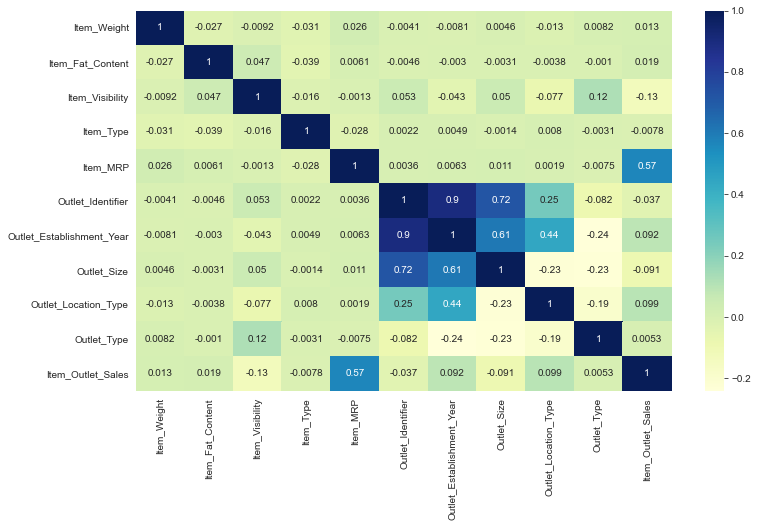

In [35]:
corr_df = train_df.copy()

for c in cat_var:
    corr_df[c] = corr_df[c].replace(list(corr_df[c].unique()) ,[i for i in range(corr_df[c].nunique())])

plt.figure(figsize=(12,7))
sns.heatmap(corr_df.corr(), cmap="YlGnBu", annot=True)

#### Summary of matrix:

- Outlet_Establishment_Year and Outlet_Identifier are highly correlated with each other, keeping outlet establishment_year as it has numerical value.

## Splitting to train and dev(cv):
* __Stratified sampling to get proportional on classes in y vector.__

In [144]:
train_df = pd.read_csv('train.csv')

In [145]:
thresh = 53

if [col for col in train_df.columns if len(train_df[col].unique()) <=thresh ]:
     cat_var = [col for col in train_df.columns if len(train_df[col].unique()) <=thresh and col != 'Item_Outlet_Sales']  
if [col for col in train_df.columns if len(train_df[col].unique()) > thresh]:
     num_var = [col for col in train_df.columns if len(train_df[col].unique()) > thresh and col != 'Item_Outlet_Sales']

In [146]:
num_var+cat_var

['Item_Identifier',
 'Item_Weight',
 'Item_Visibility',
 'Item_MRP',
 'Item_Fat_Content',
 'Item_Type',
 'Outlet_Identifier',
 'Outlet_Establishment_Year',
 'Outlet_Size',
 'Outlet_Location_Type',
 'Outlet_Type']

In [147]:
X = train_df[num_var+cat_var]
y = train_df['Item_Outlet_Sales'].values
X_train, X_cv, y_train, y_cv = train_test_split(X, y, test_size=0.1, random_state=42)

In [148]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)

(7670, 11) (7670,)
(853, 11) (853,)


In [149]:
y

array([3735.138 ,  443.4228, 2097.27  , ..., 1193.1136, 1845.5976,
        765.67  ])

# Building pipeline for : Vectorizing features and Modeling:

#### Splitting and then applying pre-processing function

In [65]:
X_train_clean = cleaning_imputing(X_train)
X_cv_clean = cleaning_imputing(X_cv)

In [66]:
if 'Item_Identifier' in num_var:
    num_var.remove('Item_Identifier')

In [67]:
full_pipeline = ColumnTransformer([("ID Features", OrdinalEncoder(handle_unknown='ignore'), ['Item_Identifier']),
                                   ("NumericalFeatures",  StandardScaler(), num_var),
                                   ("CategoricalFeatures", OneHotEncoder(handle_unknown='ignore'), cat_var),
                                  ])

In [68]:
X_train = full_pipeline.fit_transform(X_train_clean)
X_cv = full_pipeline.transform(X_cv_clean)

## Hyper parameter tuning (by Grid search) for each model was done by 5-3 fold cross validation on train data and best model was picked from cross validation data (hold out)

### Building a baseline without feature engineering

![title](TCV.png)

In [80]:
def regr_metrics(gt, preds):
    n = len(gt)
    p = X_train.shape[1]
    R2 = r2_score(gt, preds)
    MAE = mean_absolute_error(gt, preds)
    
    adj_r2 = 1-((1-R2)*(n-1)/(n-p-1))
    
    print('Adjusted R^2 = ',adj_r2, '\n')
    print('Mean Absolute Error = ',MAE, '\n')
    print(min(gt), max(gt))

### Linear Regression:

In [113]:

Lr = linear_model.LinearRegression()

In [114]:
trained_pipeline = Pipeline(steps=[('linear regression', Lr)])
trained_pipeline.fit(X_train, y_train)

Pipeline(steps=[('linear regression', LinearRegression())])

In [115]:
y_pred_train = trained_pipeline.predict(X_train)
y_pred_cv = trained_pipeline.predict(X_cv)

In [116]:
regr_metrics(y_train, y_pred_train)

Adjusted R^2 =  0.559349157662832 

Mean Absolute Error =  838.9675013813517 

33.29 13086.9648


In [117]:
regr_metrics(y_cv, y_pred_cv)

Adjusted R^2 =  0.5493796824170556 

Mean Absolute Error =  807.8347319394974 

33.29 10236.675


### Feature based: Decision Tree

In [118]:
param_grid = {"max_depth":[5, 10, 30, 75, 100], "min_samples_split":[100, 500, 1000, 5000, 10000]}

DT = DecisionTreeRegressor(random_state=42)


grid_search = GridSearchCV(DT, param_grid, cv = 3, scoring='r2')
grid_pipeline = Pipeline(steps=[('gridSearch', grid_search)])
grid_pipeline.fit(X_train, y_train)

Pipeline(steps=[('gridSearch',
                 GridSearchCV(cv=3,
                              estimator=DecisionTreeRegressor(random_state=42),
                              param_grid={'max_depth': [5, 10, 30, 75, 100],
                                          'min_samples_split': [100, 500, 1000,
                                                                5000, 10000]},
                              scoring='r2'))])

In [119]:
DT = DecisionTreeRegressor(max_depth=grid_pipeline['gridSearch'].best_params_['max_depth'], \
                            min_samples_split=grid_pipeline['gridSearch'].best_params_['min_samples_split'])
trained_pipeline = Pipeline(steps=[('DT Regressor', DT)])
trained_pipeline.fit(X_train, y_train)

Pipeline(steps=[('DT Regressor',
                 DecisionTreeRegressor(max_depth=5, min_samples_split=100))])

In [120]:
y_pred_train = trained_pipeline.predict(X_train)
y_pred_cv = trained_pipeline.predict(X_cv)


In [121]:
regr_metrics(y_train, y_pred_train)

Adjusted R^2 =  0.5995760402690835 

Mean Absolute Error =  757.0196111925042 

33.29 13086.9648


In [122]:
regr_metrics(y_cv, y_pred_cv)

Adjusted R^2 =  0.5891723544112344 

Mean Absolute Error =  728.2357067229281 

33.29 10236.675


### Ensemble Feature based: Random Forest

In [108]:
param_grid = {"max_depth":[10, 30, 75, 100], "min_samples_split":[500, 1000, 5000], \
             'n_estimators':[10, 25, 50]}

RF = RandomForestRegressor(random_state=42)


grid_search = GridSearchCV(RF, param_grid, cv = 3, scoring='r2')
grid_pipeline = Pipeline(steps=[('gridSearch', grid_search)])
grid_pipeline.fit(X_train, y_train)

Pipeline(steps=[('gridSearch',
                 GridSearchCV(cv=3,
                              estimator=RandomForestRegressor(random_state=42),
                              param_grid={'max_depth': [10, 30, 75, 100],
                                          'min_samples_split': [500, 1000,
                                                                5000],
                                          'n_estimators': [10, 25, 50]},
                              scoring='r2'))])

In [109]:
RF = RandomForestRegressor(max_depth=grid_pipeline['gridSearch'].best_params_['max_depth'], \
                            min_samples_split=grid_pipeline['gridSearch'].best_params_['min_samples_split'],\
                           n_estimators=grid_pipeline['gridSearch'].best_params_['n_estimators'])
trained_pipeline = Pipeline(steps=[('RF regressor', RF)])
trained_pipeline.fit(X_train, y_train)

Pipeline(steps=[('RF regressor',
                 RandomForestRegressor(max_depth=10, min_samples_split=500,
                                       n_estimators=50))])

In [110]:
y_pred_train = trained_pipeline.predict(X_train)
y_pred_cv = trained_pipeline.predict(X_cv)

In [111]:
regr_metrics(y_train, y_pred_train)

Adjusted R^2 =  0.597166733632646 

Mean Absolute Error =  756.7816345651866 

33.29 13086.9648


In [112]:
regr_metrics(y_cv, y_pred_cv)

Adjusted R^2 =  0.5874573637169287 

Mean Absolute Error =  726.8971846814725 

33.29 10236.675


### Ensemble Gradient based: Extreme gradient boosting

In [97]:
param_grid = {'n_estimators' : [100, 200, 300, 400, 500, 600], 'max_depth' : [5, 20, 50],
                'learning_rate' : [0.1, 0.5, 1.0]}

XGB = XGBRegressor()


grid_search = GridSearchCV(XGB, param_grid, cv = 3, scoring='r2')
grid_pipeline = Pipeline(steps=[('gridSearch', grid_search)])
grid_pipeline.fit(X_train, y_train)

Pipeline(steps=[('gridSearch',
                 GridSearchCV(cv=3,
                              estimator=XGBRegressor(base_score=None,
                                                     booster=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     gamma=None, gpu_id=None,
                                                     importance_type='gain',
                                                     interaction_constraints=None,
                                                     learning_rate=None,
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     min_child_weight=None,
                                     

In [99]:
XGB = XGBRegressor(n_estimators=grid_pipeline['gridSearch'].best_params_['n_estimators'], \
                            max_depth=grid_pipeline['gridSearch'].best_params_['max_depth'],\
                              learning_rate=grid_pipeline['gridSearch'].best_params_['learning_rate'])
trained_pipeline = Pipeline(steps=[('XGBoost Regressor', XGB)])
trained_pipeline.fit(X_train, y_train)

Pipeline(steps=[('XGBoost Regressor',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, gamma=0, gpu_id=-1,
                              importance_type='gain',
                              interaction_constraints='', learning_rate=0.1,
                              max_delta_step=0, max_depth=5, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=8, num_parallel_tree=1,
                              random_state=0, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, subsample=1,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None))])

In [100]:
y_pred_train = trained_pipeline.predict(X_train)
y_pred_cv = trained_pipeline.predict(X_cv)

In [106]:
regr_metrics(y_train, y_pred_train)

Adjusted R^2 =  0.6860057579005021 

Mean Absolute Error =  677.3379333480632 

33.29 13086.9648


In [107]:
regr_metrics(y_cv, y_pred_cv)

Adjusted R^2 =  0.5855174208917884 

Mean Absolute Error =  728.7816098529507 

33.29 10236.675


### Performance metric and comparision of models:

Performance metric for regression, Adj R2 will define the how much the features explain the variance in response variable.
MAE - Mean absolute error, how much on average will there be a deviation from the prediction.

#### Results on CV (Interested class):


* Linear Regression
    - adj R2: 0.549
    - MAE = 807.83


* Decision Tree
    - adj R2: 0.589
    - MAE = 757.01
    
    
* Random Forest
    - adj R2: 0.587
    - MAE = 728.2
   
   
* XGBOOST
    - adj R2: 0.585
    - MAE = 728.78

* RF and XGBoost results are comprable, Selecting them.

## Feature engineering & Experimentation:

In [124]:
##### plot styling #####
sns.set_style("whitegrid")
sns.set_palette("bright")

### Appling log-transform on numerical features:

<AxesSubplot:ylabel='Density'>

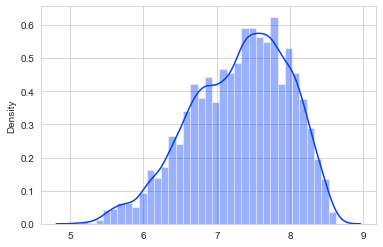

In [179]:
sns.distplot(np.log(train_df['Item_Weight'] * train_df['Item_MRP']))

#### Summary of transform:

* Products that are heavy will probably be expensive

In [180]:
def feature_engg(df):
    data = df.copy()
    data['Item_Weight_MRP'] = np.log(data['Item_Weight'] * data['Item_MRP'])
    
    return data

In [181]:
train_df = pd.read_csv('train.csv')

In [182]:
train_df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [183]:
train_df_clean = cleaning_imputing(train_df)

In [184]:
train_df_clean

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,22,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,12,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,22,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,23,Medium,Tier 3,Grocery Store,732.3800
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,34,High,Tier 3,Supermarket Type1,994.7052
...,...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,34,High,Tier 3,Supermarket Type1,2778.3834
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,19,Medium,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,17,Small,Tier 2,Supermarket Type1,1193.1136
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,12,Medium,Tier 3,Supermarket Type2,1845.5976


In [185]:
feature_engg(train_df_clean).head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Weight_MRP
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,22,Medium,Tier 1,Supermarket Type1,3735.1380,7.750712
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,12,Medium,Tier 3,Supermarket Type2,443.4228,5.655130
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,22,Medium,Tier 1,Supermarket Type1,2097.2700,7.815334
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,23,Medium,Tier 3,Grocery Store,732.3800,8.159439
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,34,High,Tier 3,Supermarket Type1,994.7052,6.175830


In [186]:
f_cat_var = ['Item_Fat_Content','Item_Type','Outlet_Identifier','Outlet_Establishment_Year', 'Outlet_Size',
             'Outlet_Location_Type', 'Outlet_Type']
f_num_var = ['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Weight_MRP']

In [187]:
full_pipeline = ColumnTransformer([("ID Features", OrdinalEncoder(handle_unknown='ignore'), ['Item_Identifier']),
                                   ("NumericalFeatures",  StandardScaler(), f_num_var),
                                   ("CategoricalFeatures", OneHotEncoder(handle_unknown='ignore'), f_cat_var),
                                  ])

In [188]:
X = feature_engg(train_df_clean)[f_cat_var+f_num_var+['Item_Identifier']]
y = feature_engg(train_df_clean)['Item_Outlet_Sales'].values
X_train, X_cv, y_train, y_cv = train_test_split(X, y, test_size=0.1, random_state=42)
X_train = full_pipeline.fit_transform(X_train)
X_cv = full_pipeline.transform(X_cv)

In [189]:
X.columns

Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Weight', 'Item_Visibility', 'Item_MRP',
       'Item_Weight_MRP', 'Item_Identifier'],
      dtype='object')

In [190]:
X.head()

,Item_Fat_Content,Item_Type,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Weight,Item_Visibility,Item_MRP,Item_Weight_MRP,Item_Identifier
0,Low Fat,Dairy,OUT049,22,Medium,Tier 1,Supermarket Type1,9.30,0.016047,249.8092,7.750712,FDA15
1,Regular,Soft Drinks,OUT018,12,Medium,Tier 3,Supermarket Type2,5.92,0.019278,48.2692,5.655130,DRC01
2,Low Fat,Meat,OUT049,22,Medium,Tier 1,Supermarket Type1,17.50,0.016760,141.6180,7.815334,FDN15
3,Regular,Fruits and Vegetables,OUT010,23,Medium,Tier 3,Grocery Store,19.20,0.000000,182.0950,8.159439,FDX07
4,Low Fat,Household,OUT013,34,High,Tier 3,Supermarket Type1,8.93,0.000000,53.8614,6.175830,NCD19


In [191]:

XGB = XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, gamma=0, gpu_id=-1,
                              importance_type='gain',
                              interaction_constraints='', learning_rate=0.1,
                              max_delta_step=0, max_depth=5, min_child_weight=1,
                              n_estimators=100, n_jobs=8, num_parallel_tree=1,
                              random_state=0, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, subsample=1,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None)


trained_pipeline = Pipeline(steps=[('XGBoost', XGB)])
trained_pipeline.fit(X_train, y_train)



Pipeline(steps=[('XGBoost',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, gamma=0, gpu_id=-1,
                              importance_type='gain',
                              interaction_constraints='', learning_rate=0.1,
                              max_delta_step=0, max_depth=5, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=8, num_parallel_tree=1,
                              random_state=0, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, subsample=1,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None))])

In [192]:
y_pred_train = trained_pipeline.predict(X_train)
y_pred_cv = trained_pipeline.predict(X_cv)

In [193]:
regr_metrics(y_train, y_pred_train)

Adjusted R^2 =  0.692616677933339 

Mean Absolute Error =  672.3336892507019 

33.29 13086.9648


In [194]:
regr_metrics(y_cv, y_pred_cv)

Adjusted R^2 =  0.5855206847193075 

Mean Absolute Error =  724.5956700678335 

33.29 10236.675


# Model Interpretation:

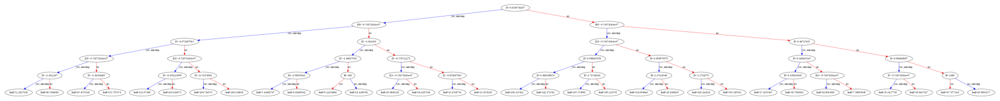

In [196]:
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(XGB, num_trees=2, ax=ax)
plt.savefig("temp.pdf")
plt.show()

In [208]:
all_feats = ['Item_Identifier'] + f_num_var + full_pipeline.transformers_[2][1].get_feature_names(f_cat_var).tolist()

In [209]:
results = pd.DataFrame()
results['Features'] = all_feats
results['Importances'] = XGB.feature_importances_
results.sort_values(by='Importances',ascending=False,inplace=True)
results = results.reset_index(drop=True)

<AxesSubplot:xlabel='Importances', ylabel='Features'>

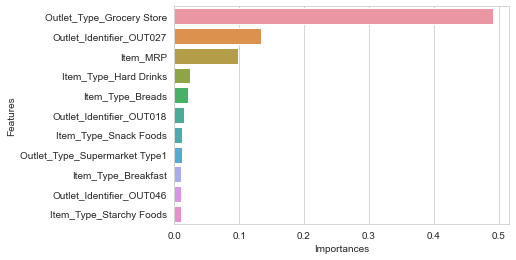

In [210]:
sns.barplot(data=results.iloc[:11], x='Importances', y='Features')

#### Summary:

- The features with high importances also have a strong indication to classify.

## Explaining test predictions

In [214]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=all_feats, 
                                                   class_names=['Item_Outlet_Sales'], 
                                                   verbose=True, mode='regression')

In [218]:
y_cv[43]

1783.6782

In [219]:
exp = explainer.explain_instance(X_cv[43], XGB.predict, num_features=52)
exp.show_in_notebook(show_table=True)

Intercept 1663.719349448684
Prediction_local [1663.71427739]
Right: 1524.9467


## Post Prediction Analysis to check for data drift

In [220]:
##### plot styling #####
sns.set_style("whitegrid")
sns.set_palette("bright")

In [221]:
test_df = pd.read_csv('test.csv')

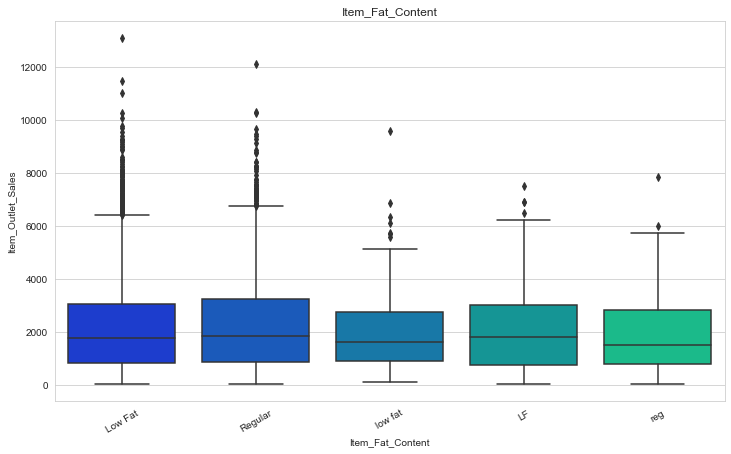

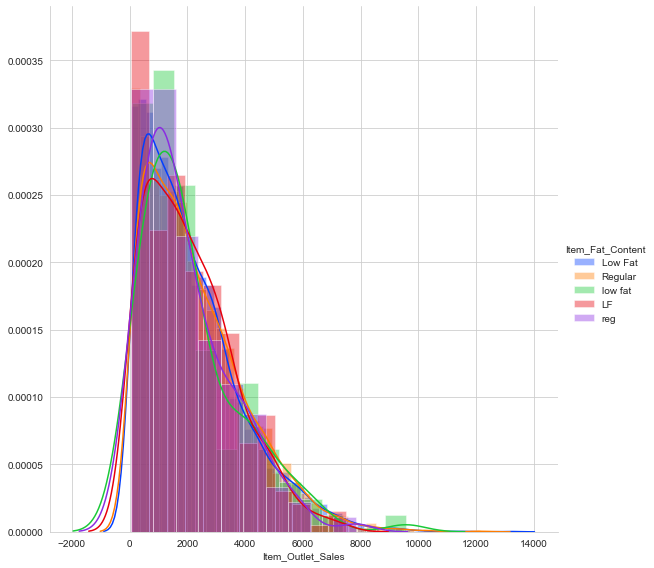

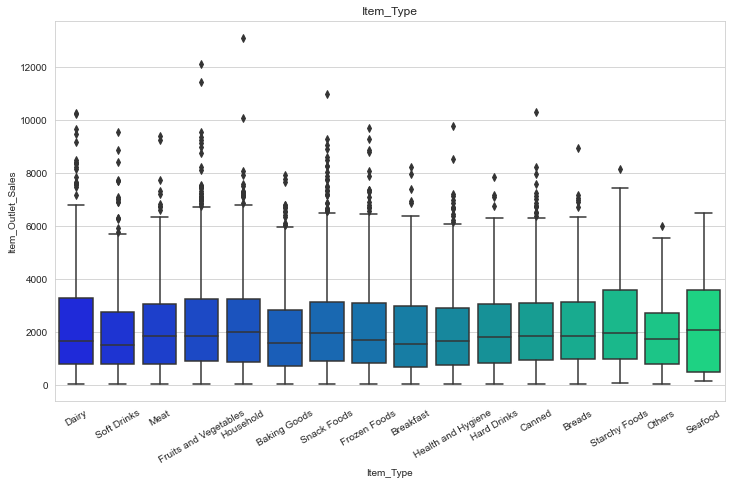

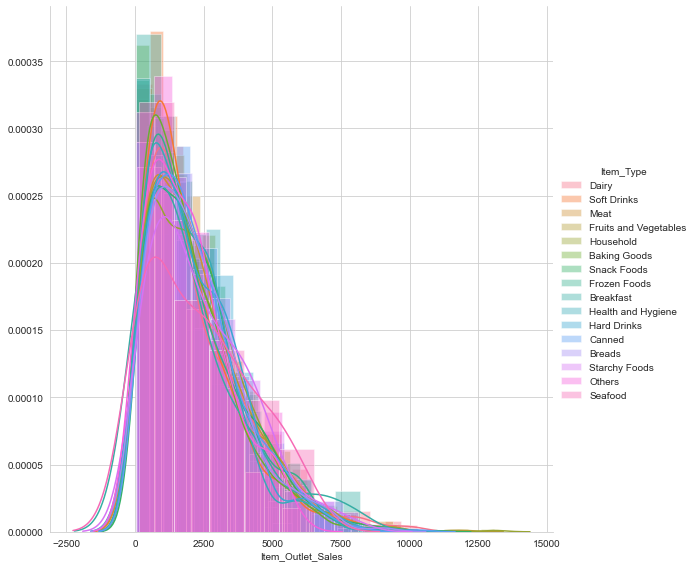

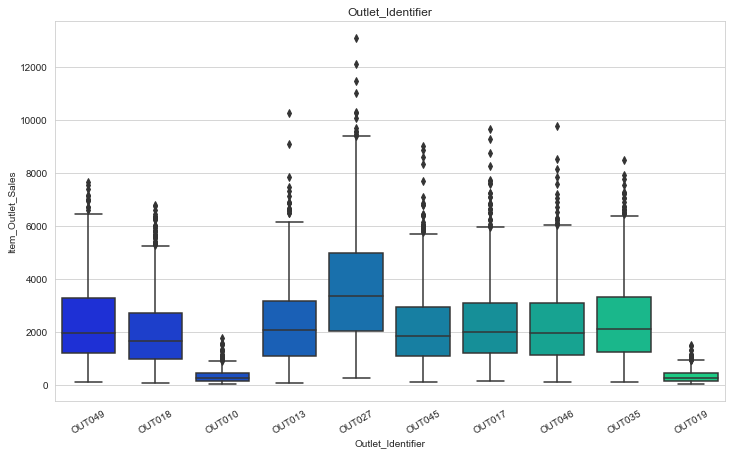

...

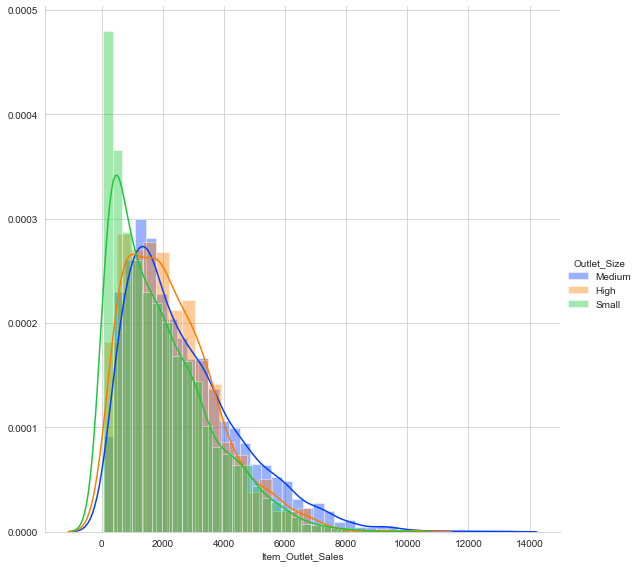

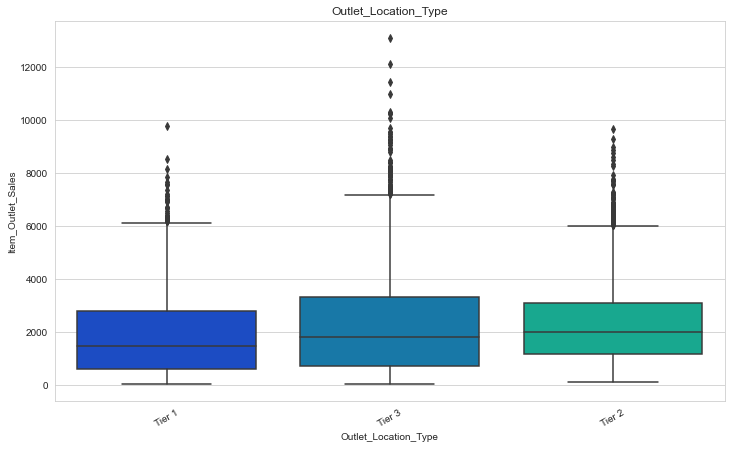

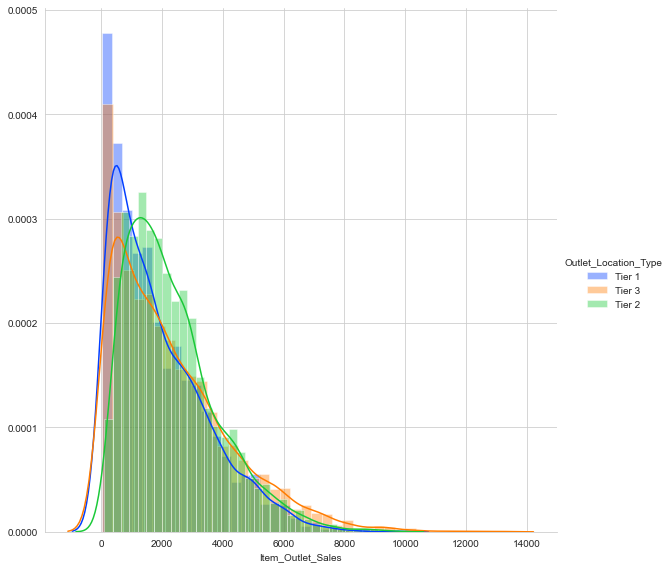

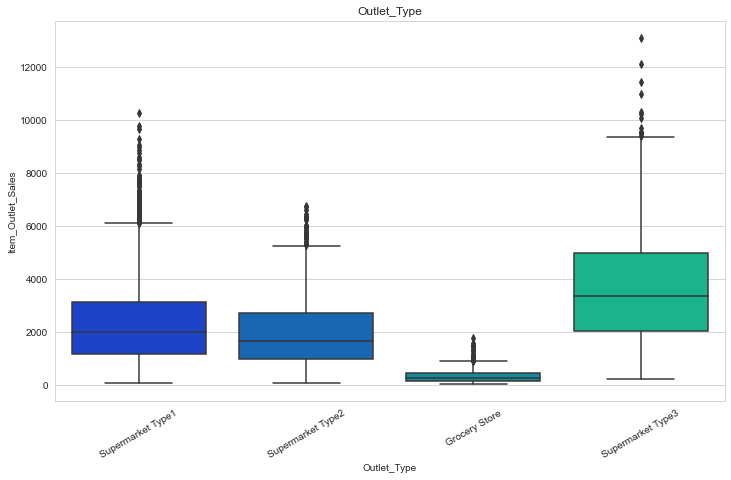

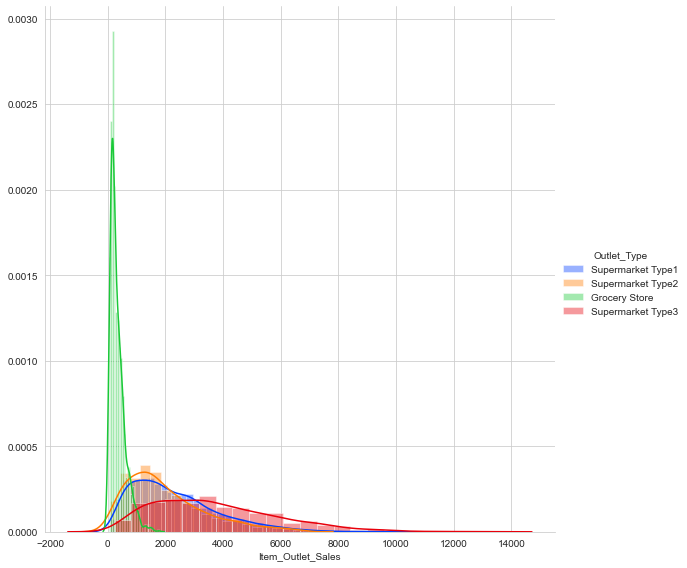

In [222]:
for cats in cat_var:
    categoric_to_numerical(cats)

DRA12 NCZ54


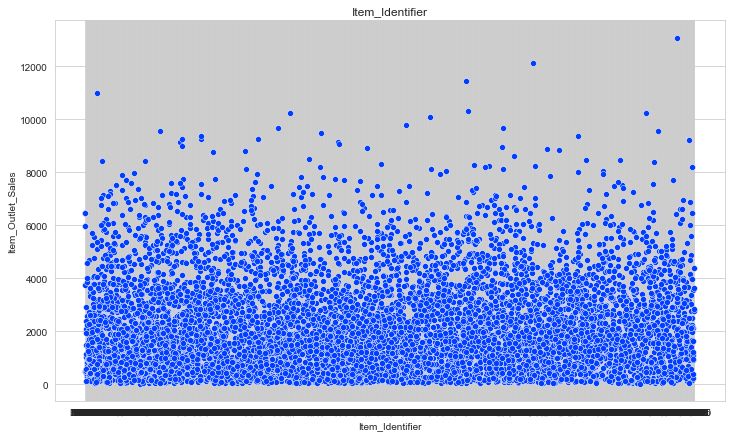

4.555 21.35


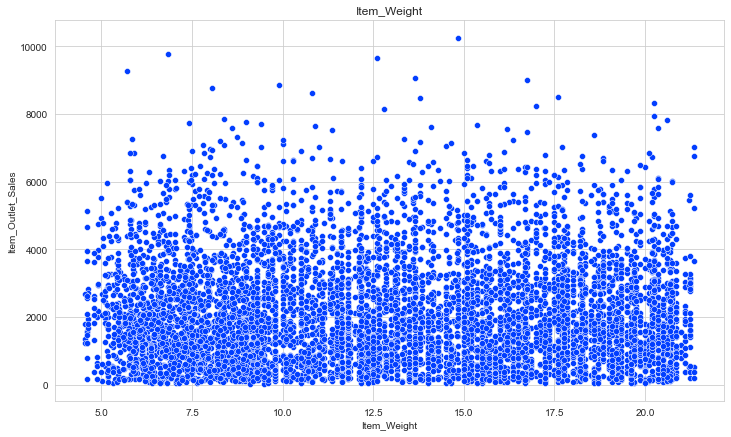

0.0 0.328390948


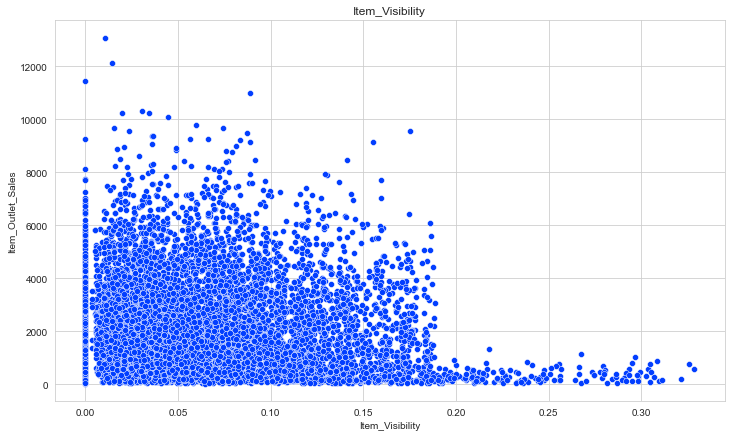

31.29 266.8884


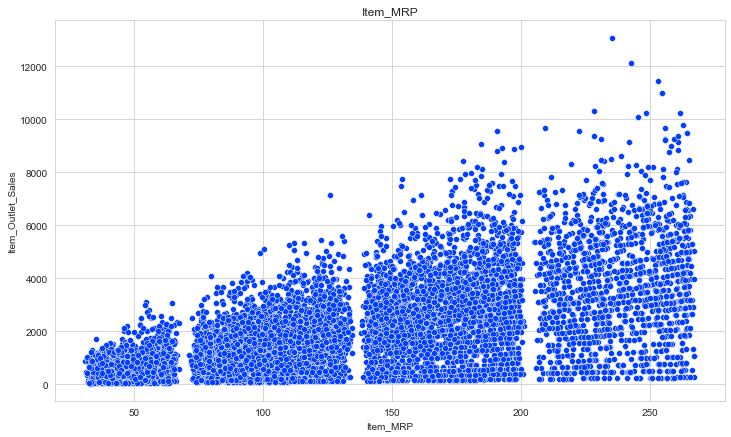

In [223]:
for num in num_var:
    numeric_to_numerical(num)

#### The same is observed in train data, no data drift

# Next Steps/ Suggestions:

* Feature engineer further and experiement for higher F1/AUC score.
* More EDA understanding to a higher level of domain understanding.
* More details on __Error Analysis__ on model predictions.
* Team discussion.
* Deployment after strong series of data science lifecycle checks.
